# Capstone Project: 
# Create a Customer Segmentation Report for Arvato Financial Services

In this project, you will analyze demographics data for customers of a mail-order sales company in Germany, comparing it against demographics information for the general population. You'll use unsupervised learning techniques to perform customer segmentation, identifying the parts of the population that best describe the core customer base of the company. Then, you'll apply what you've learned on a third dataset with demographics information for targets of a marketing campaign for the company, and use a model to predict which individuals are most likely to convert into becoming customers for the company. The data that you will use has been provided by our partners at Bertelsmann Arvato Analytics, and represents a real-life data science task.

If you completed the first term of this program, you will be familiar with the first part of this project, from the unsupervised learning project. The versions of those two datasets used in this project will include many more features and has not been pre-cleaned. You are also free to choose whatever approach you'd like to analyzing the data rather than follow pre-determined steps. In your work on this project, make sure that you carefully document your steps and decisions, since your main deliverable for this project will be a blog post reporting your findings.

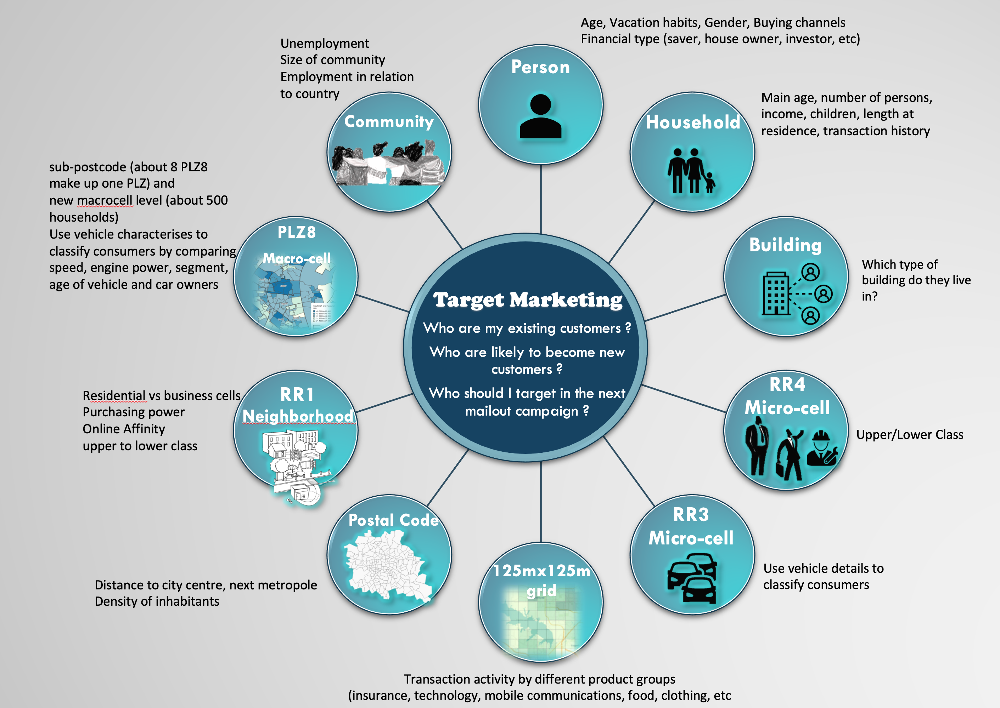

# PART 2: CUSTOMER SEGMENTATION

This notebook is using the cleaning function, trained imputer and column configuration designed and generated in first notebook to:
- Clean all input files    
- Impute missing values using pre-trained machine learning IterativeImputer
- Reduce feature dimensionality using PCA
- Clustering using KMEANS

---

## Contents

1.  <a href='#load_data'>Load the data</a>    
1.  <a href='#feature_engineering'>Feature Engineering and Transformations</a>
1.  <a href='#scale'>Feature scaling</a>
1.  <a href='#pca'>Dimension reduction with PCA</a>
1.  <a href='#cluster_population'>Population Segmentation</a>
1.  <a href='#cluster_customer'>Customer Segmentation</a>
1.  <a href='#references'>References</a>

---

In [1]:
# import libraries 

# Import custom modules
from src.data_loading import *
from src.config import *
from src.data_cleansing import *
from src.visuals import *
from src.helper import *
import matplotlib.pyplot as plt

from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans

# To load and save models
from pickle import dump, load

import sagemaker
import boto3
import os

# environment settings
pd.set_option('display.max_column', 400)
pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_colwidth', 400)
pd.set_option('expand_frame_repr', True)

# magic word for producing visualizations in notebook
%matplotlib inline

# suppress matplotlib user warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="matplotlib")

<a id='load_data'></a>
# Step 1: Load the data

During data exploration a general cleaning procedure was written, which will be reused here
For explainations on decision refer back to irst notebeook

#### Step 1.2: Load full DEMOGRAPHICS data

In [2]:
path = "{}/{}".format(path_raw, filename_demographics)
azdias, azdias_extended_na = get_data(path)

#### Step 1.3: Load own CUSTOMER data

In [3]:
path = "{}/{}".format(path_raw, filename_customer)
customers, customers_extended_na = get_data(path)

Find are remove addtional columns present in CUSTOMER dataset

In [4]:
list1 = list(customers.columns.values)
list2 = list(azdias.columns.values)
columns_to_drop = list(set(list1) - set(list2))
print('Difference in columns: {}'.format(columns_to_drop))

Difference in columns: ['PRODUCT_GROUP', 'CUSTOMER_GROUP', 'ONLINE_PURCHASE']


In [5]:
customers['PRODUCT_GROUP'].value_counts()

COSMETIC_AND_FOOD    100860
FOOD                  47382
COSMETIC              43410
Name: PRODUCT_GROUP, dtype: int64

In [6]:
customers['ONLINE_PURCHASE'].value_counts()

0    174356
1     17296
Name: ONLINE_PURCHASE, dtype: int64

In [7]:
customers['CUSTOMER_GROUP'].value_counts()

MULTI_BUYER     132238
SINGLE_BUYER     59414
Name: CUSTOMER_GROUP, dtype: int64

In [8]:
# Build new dataset containing these additional columns as we can use them for supervised training in next step
customers_extra = customers[columns_to_drop]
customers_extra.isna().sum()

PRODUCT_GROUP      0
CUSTOMER_GROUP     0
ONLINE_PURCHASE    0
dtype: int64

In [9]:
# drop these columns for customer dataset because to cluster it needs to be identical to demographics dataset
customers = customers.drop(columns_to_drop, axis=1, errors='ignore')
customers_extended_na.drop(columns_to_drop, axis=1, inplace=True, errors='ignore')

<a id='feature_engineering'></a>
# Step 2: Feature Engineering and Transformations

Drop relevant columns and rows, and apply feature engineering as designed during ETA step

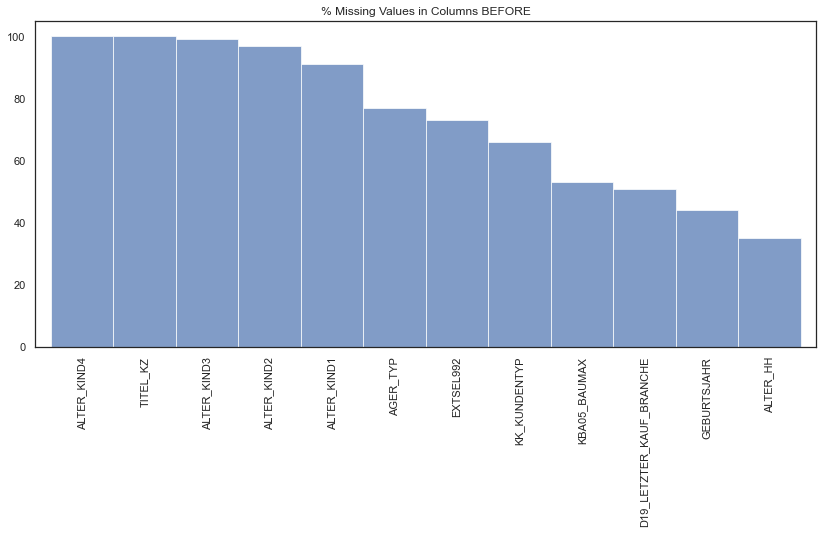

Summarize GRID columns.....
Binarize GRID columns.....

Columns dropped due to missing values ['EXTSEL992', 'D19_TELKO_MOBILE', 'D19_SCHUHE', 'D19_VERSAND_REST', 'AGER_TYP', 'TITEL_KZ', 'D19_HAUS_DEKO', 'ALTER_KIND2', 'ALTER_KIND1', 'D19_RATGEBER', 'D19_BEKLEIDUNG_GEH', 'CAMEO_DEU_2015', 'D19_TELKO_ONLINE_QUOTE_12', 'ANZ_STATISTISCHE_HAUSHALTE', 'D19_BANKEN_GROSS', 'KK_KUNDENTYP', 'ALTER_KIND4', 'ALTER_KIND3', 'D19_FREIZEIT']


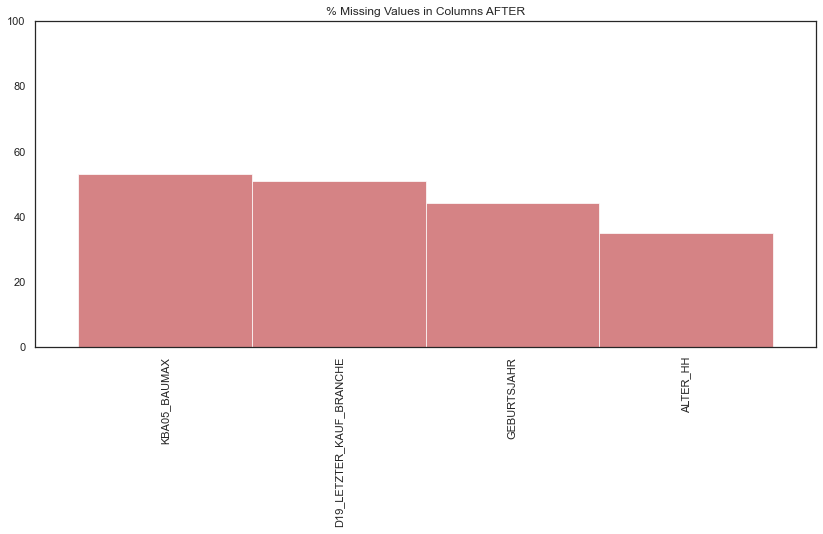

Shape BEFORE row deletion: (891221, 348)


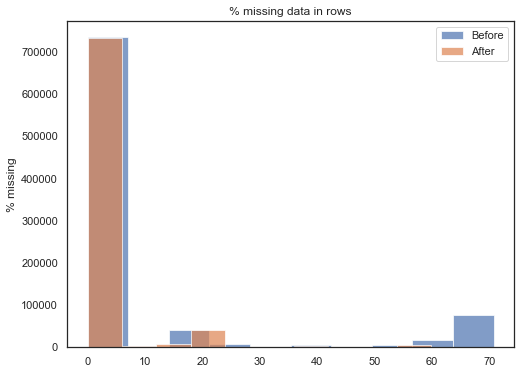

Shape AFTER row deletion: (798029, 348) with threshold of: 0.6
Adding few features WOHNLAGE_QUALITY and WOHNLAGE_RURAL ..........
Adding few features PRAEGENDE_JUGENDJAHRE_DECADE and PRAEGENDE_JUGENDJAHRE_MOVEMENT ..........
Adding few features CAMEO_INTL_2015_WEALTH and CAMEO_INTL_2015_LIFESTAGE ..........
Cleaning PLZ8_BAUMAX, KBA05_BAUMAX .......... 
Cleaning OST_WEST_KZ .......... 
Reducing range for D19_KONSUMTYP_MAX from 1-8 to 1-5
Reducing range for D19_KONSUMTYP from 1-9 to 1-7
Rerank ranges for banking transactions
Categorial columns to one hot encode: ['D19_LETZTER_KAUF_BRANCHE']
353 total features BEFORE one-hot encoding
386 total features AFTER one-hot encoding
[IterativeImputer] Completing matrix with shape (798029, 386)
[IterativeImputer] Ending imputation round 1/15, elapsed time 23.15
[IterativeImputer] Ending imputation round 2/15, elapsed time 44.63
[IterativeImputer] Ending imputation round 3/15, elapsed time 66.68
[IterativeImputer] Ending imputation round 4/15, ela

(798029, 423)

In [10]:
azdias_cleaned = clean(azdias.copy(), 
                       azdias_extended_na, 
                       rows_threshold=0.60, 
                       impute=True,
                       kind='unsupervised')
azdias_cleaned.shape

In [11]:
azdias_cleaned.head()

,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,...,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_OEKO,D19_LETZT

In [12]:
azdias_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 798029 entries, 910220 to 825787
Columns: 423 entries, AKT_DAT_KL to GRID_YEAR_LAST_ACTIVE_2
dtypes: float64(1), int16(315), uint8(107)
memory usage: 573.1 MB


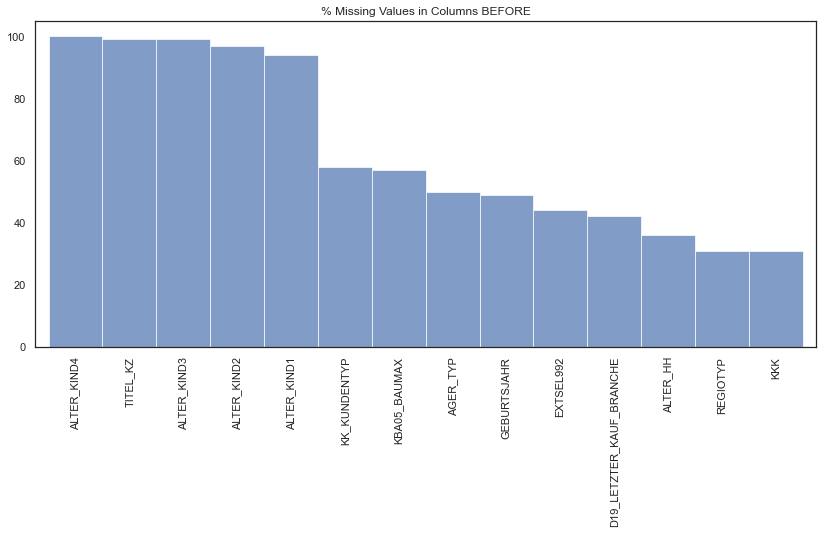

Summarize GRID columns.....
Binarize GRID columns.....

Columns dropped due to missing values ['EXTSEL992', 'D19_TELKO_MOBILE', 'D19_SCHUHE', 'D19_VERSAND_REST', 'AGER_TYP', 'TITEL_KZ', 'D19_HAUS_DEKO', 'ALTER_KIND2', 'ALTER_KIND1', 'D19_RATGEBER', 'D19_BEKLEIDUNG_GEH', 'CAMEO_DEU_2015', 'D19_TELKO_ONLINE_QUOTE_12', 'ANZ_STATISTISCHE_HAUSHALTE', 'D19_BANKEN_GROSS', 'KK_KUNDENTYP', 'ALTER_KIND4', 'ALTER_KIND3', 'D19_FREIZEIT']


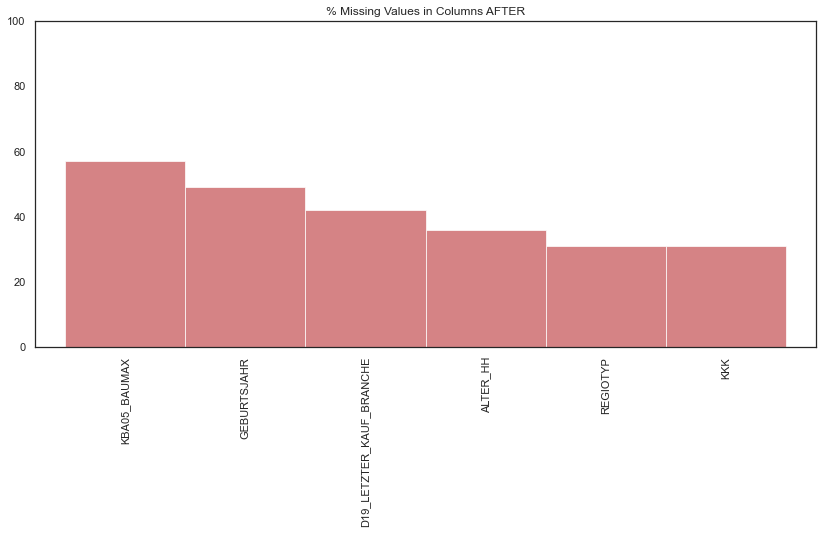

Shape BEFORE row deletion: (191652, 348)


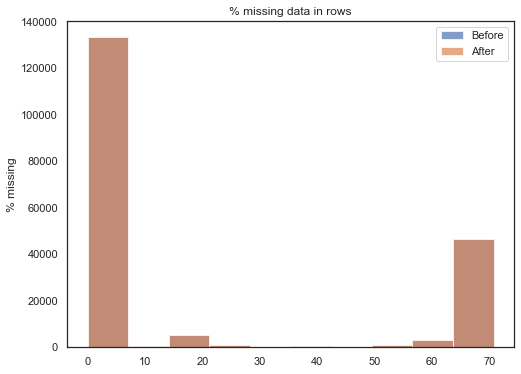

Shape AFTER row deletion: (191652, 348) with threshold of: 1
Adding few features WOHNLAGE_QUALITY and WOHNLAGE_RURAL ..........
Adding few features PRAEGENDE_JUGENDJAHRE_DECADE and PRAEGENDE_JUGENDJAHRE_MOVEMENT ..........
Adding few features CAMEO_INTL_2015_WEALTH and CAMEO_INTL_2015_LIFESTAGE ..........
Cleaning PLZ8_BAUMAX, KBA05_BAUMAX .......... 
Cleaning OST_WEST_KZ .......... 
Reducing range for D19_KONSUMTYP_MAX from 1-8 to 1-5
Reducing range for D19_KONSUMTYP from 1-9 to 1-7
Rerank ranges for banking transactions
Categorial columns to one hot encode: ['D19_LETZTER_KAUF_BRANCHE']
353 total features BEFORE one-hot encoding
386 total features AFTER one-hot encoding
[IterativeImputer] Completing matrix with shape (191652, 386)
[IterativeImputer] Ending imputation round 1/15, elapsed time 8.37
[IterativeImputer] Ending imputation round 2/15, elapsed time 16.49
[IterativeImputer] Ending imputation round 3/15, elapsed time 24.94
[IterativeImputer] Ending imputation round 4/15, elapse

(191652, 422)

In [13]:
customers_cleaned = clean(customers.copy(), 
                          customers_extended_na, 
                          rows_threshold=1, 
                          impute=True,
                          kind='unsupervised')
customers_cleaned.shape

In [14]:
customers_cleaned.head()

,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,...,KBA13_SITZE_6,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_

<a id='scale'></a>
# Step 3: Feature Scaling

Load pre-trained scaler from PART 1

In [15]:
scaler = load(open(filename_scaler_unsupervised, 'rb'))
scaled_azdias = scaler.transform(azdias_cleaned.copy())
scaled_azdias = scaled_azdias.astype('float16', copy=False)

# build dataset for further explorations
df_scaled_azdias = pd.DataFrame(scaled_azdias, 
                                columns=azdias_cleaned.columns,
                                index=azdias_cleaned.index)
df_scaled_azdias.head()

,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,...,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_OEKO,D19_LETZT

In [16]:
df_scaled_azdias.shape

(798029, 423)

In [17]:
azdias_cleaned.head()

,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,...,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_OEKO,D19_LETZT

In [18]:
print('Population index min {}, max {}'.format(df_scaled_azdias.index.min(), df_scaled_azdias.index.max()))

Population index min 191653, max 1082873


In [19]:
# check if there are any columns missing in customers dataset due to ohn. 
# MinMax scaling requires in latest version the same number of features in the same order
cols = list(set(azdias_cleaned.columns) - set(customers_cleaned.columns)) 
for col in cols:
    print('Column corrected: {}'.format(col))
    loc = azdias_cleaned.columns.get_loc(col)
    customers_cleaned.insert(loc, column=col, value=0)

Column corrected: GEBAEUDETYP_5


In [20]:
scaled_customers = scaler.transform(customers_cleaned.copy())
scaled_customers = scaled_customers.astype('float32', copy=False)

# check columns to understand what happened
df_scaled_customers = pd.DataFrame(scaled_customers, 
                                   columns=customers_cleaned.columns,
                                   index=customers_cleaned.index).round(4)
df_scaled_customers.head()

,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,KBA13_MERCEDES,...,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_OEKO,D19_LETZT

In [21]:
df_scaled_customers.shape

(191652, 423)

In [22]:
print('Customer index min {}, max {}'.format(df_scaled_customers.index.min(), df_scaled_customers.index.max()))

Customer index min 1, max 191652


In [23]:
df_scaled_azdias.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 798029 entries, 910220 to 825787
Columns: 423 entries, AKT_DAT_KL to GRID_YEAR_LAST_ACTIVE_2
dtypes: float16(423)
memory usage: 649.9 MB


<a id='pca'></a>
# Step 4: Dimension reduction with PCA

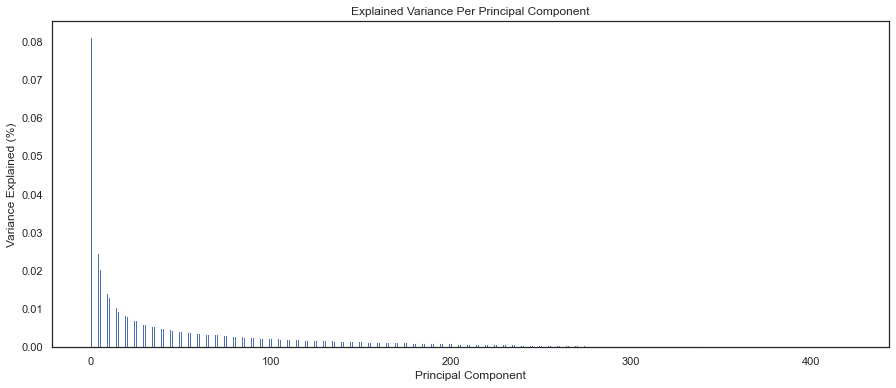

In [24]:
# do PCA with all features
pca = PCA()
azdias_pca = pca.fit_transform(scaled_azdias)

# Investigate the variance accounted for by each principal component.
scree_plot(pca, annotate=False, cumulative=False)

Number of components 1, Accuracy 0.0812717038076263
Number of components 6, Accuracy 0.25913750032671545
Number of components 11, Accuracy 0.3352031256828495
Number of components 16, Accuracy 0.3910298105361066
Number of components 21, Accuracy 0.43436415938953743
Number of components 26, Accuracy 0.4718621345080582
Number of components 31, Accuracy 0.5037052112141291
Number of components 36, Accuracy 0.5323772875775847
Number of components 41, Accuracy 0.5584942023347433
Number of components 46, Accuracy 0.5804372179278636
Number of components 51, Accuracy 0.6025479989578905
Number of components 56, Accuracy 0.622675650202156
Number of components 61, Accuracy 0.6414604964972337
Number of components 66, Accuracy 0.6598095457243633
Number of components 71, Accuracy 0.6764159744313057
Number of components 76, Accuracy 0.692927469906592
Number of components 81, Accuracy 0.7084124182602135
Number of components 86, Accuracy 0.7225347683958316
Number of components 91, Accuracy 0.735986611496

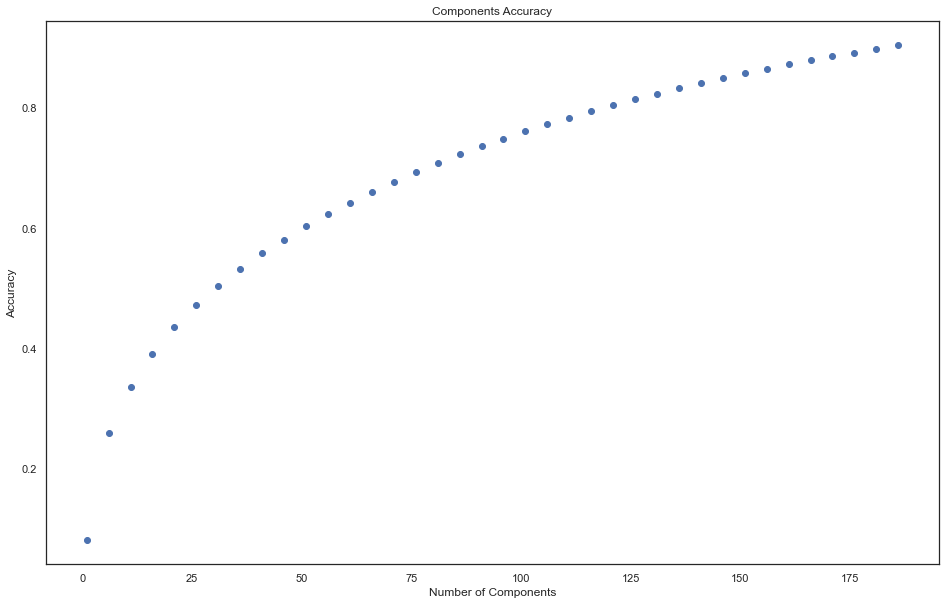

In [25]:
#Find number of components providing around 90% of variance explained
   
accs, comps = find_components(scaled_azdias, from_component=1, to_component=191, interval=5)

In [28]:
# do the final PCA fit
pca = PCA(180)
pca.fit(scaled_azdias)
azdias_pca = pca.transform(scaled_azdias)

# write PCA model locally for possible re-use later
dump(pca, open(filename_pca, 'wb'))

In [29]:
azdias_pca.shape

(798029, 180)

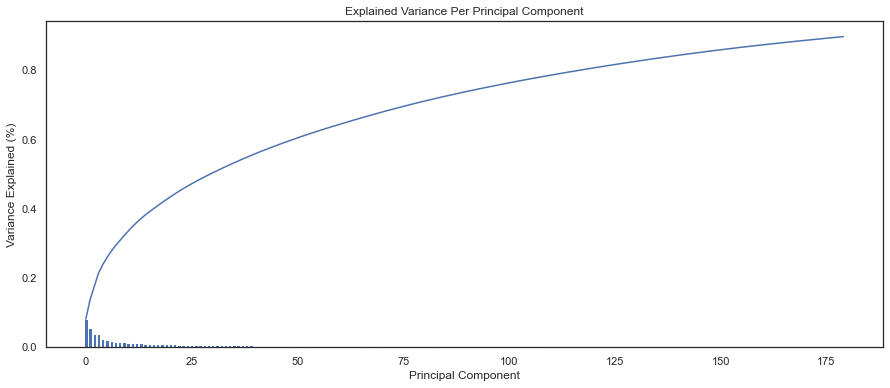

In [30]:
scree_plot(pca, annotate=False, cumulative=True)

In [31]:
pca_results = summarize_pca_results(azdias_cleaned, pca)
pca_results[:5]

,Explained Variance,AKT_DAT_KL,ALTER_HH,ANZ_HAUSHALTE_AKTIV,ANZ_HH_TITEL,ANZ_KINDER,ANZ_PERSONEN,ANZ_TITEL,ARBEIT,BALLRAUM,CJT_KATALOGNUTZER,CJT_TYP_1,CJT_TYP_2,CJT_TYP_3,CJT_TYP_4,CJT_TYP_5,CJT_TYP_6,D19_BANKEN_DIREKT,D19_BANKEN_LOKAL,D19_BANKEN_OFFLINE_DATUM,D19_BANKEN_ONLINE_DATUM,D19_BANKEN_REST,D19_BEKLEIDUNG_REST,D19_BILDUNG,D19_BIO_OEKO,D19_BUCH_CD,D19_DIGIT_SERV,D19_DROGERIEARTIKEL,D19_ENERGIE,D19_GARTEN,D19_GESAMT_ANZ_12,D19_GESAMT_ONLINE_QUOTE_12,D19_HANDWERK,D19_KINDERARTIKEL,D19_KOSMETIK,D19_LEBENSMITTEL,D19_LOTTO,D19_NAHRUNGSERGAENZUNG,D19_REISEN,D19_SAMMELARTIKEL,D19_SONSTIGE,D19_TECHNIK,D19_TELKO_OFFLINE_DATUM,D19_TELKO_ONLINE_DATUM,D19_TELKO_REST,D19_TIERARTIKEL,D19_VERSAND_ANZ_12,D19_VERSAND_OFFLINE_DATUM,D19_VERSAND_ONLINE_DATUM,D19_VERSAND_ONLINE_QUOTE_12,D19_VERSI_OFFLINE_DATUM,D19_VERSI_ONLINE_DATUM,D19_VERSICHERUNGEN,D19_VOLLSORTIMENT,D19_WEIN_FEINKOST,DSL_FLAG,EINGEZOGENAM_HH_JAHR,EWDICHTE,FINANZ_ANLEGER,FINANZ_HAUSBAUER,FINANZ_MINIMALIST,FINANZ_SPARER,FINANZ_UNAUFFAELLIGER,FINANZ_VORSORGER,FIRMENDICHTE,GEBAEUDETYP_RASTER,GREEN_AVANTGARDE,HH_DELTA_FLAG,HH_EINKOMMEN_SCORE,INNENSTADT,KBA05_ALTER1,KBA05_ALTER2,KBA05_ALTER3,KBA05_ALTER4,KBA05_ANHANG,KBA05_ANTG1,KBA05_ANTG2,KBA05_ANTG3,KBA05_ANTG4,KBA05_AUTOQUOT,KBA05_CCM1,KBA05_CCM2,KBA05_CCM3,KBA05_CCM4,KBA05_DIESEL,KBA05_FRAU,KBA05_GBZ,KBA05_HERST1,KBA05_HERST2,KBA05_HERST3,KBA05_HERST4,KBA05_HERST5,KBA05_HERSTTEMP,KBA05_KRSAQUOT,KBA05_KRSHERST1,KBA05_KRSHERST2,KBA05_KRSHERST3,KBA05_KRSKLEIN,KBA05_KRSOBER,KBA05_KRSVAN,KBA05_KRSZUL,KBA05_KW1,KBA05_KW2,KBA05_KW3,KBA05_MAXAH,KBA05_MAXBJ,KBA05_MAXSEG,KBA05_MAXVORB,KBA05_MOD1,KBA05_MOD2,KBA05_MOD3,KBA05_MOD4,KBA05_MOD8,KBA05_MODTEMP,KBA05_MOTOR,KBA05_MOTRAD,KBA05_SEG1,KBA05_SEG10,KBA05_SEG2,KBA05_SEG3,KBA05_SEG4,KBA05_SEG5,KBA05_SEG6,KBA05_SEG7,KBA05_SEG8,KBA05_SEG9,KBA05_VORB0,KBA05_VORB1,KBA05_VORB2,KBA05_ZUL1,KBA05_ZUL2,KBA05_ZUL3,KBA05_ZUL4,KBA13_ALTERHALTER_30,KBA13_ALTERHALTER_45,KBA13_ALTERHALTER_60,KBA13_ALTERHALTER_61,KBA13_ANZAHL_PKW,KBA13_AUDI,KBA13_AUTOQUOTE,KBA13_BJ_1999,KBA13_BJ_2000,KBA13_BJ_2004,KBA13_BJ_2006,KBA13_BJ_2008,KBA13_BJ_2009,KBA13_BMW,KBA13_CCM_0_1400,KBA13_CCM_1000,KBA13_CCM_1200,KBA13_CCM_1400,KBA13_CCM_1401_2500,KBA13_CCM_1500,KBA13_CCM_1600,KBA13_CCM_1800,KBA13_CCM_2000,KBA13_CCM_2500,KBA13_CCM_2501,KBA13_CCM_3000,KBA13_CCM_3001,KBA13_FAB_ASIEN,KBA13_FAB_SONSTIGE,KBA13_FIAT,KBA13_FORD,KBA13_HERST_ASIEN,KBA13_HERST_AUDI_VW,KBA13_HERST_BMW_BENZ,KBA13_HERST_EUROPA,KBA13_HERST_FORD_OPEL,KBA13_HERST_SONST,KBA13_KMH_0_140,KBA13_KMH_110,KBA13_KMH_140,KBA13_KMH_140_210,KBA13_KMH_180,KBA13_KMH_210,KBA13_KMH_211,KBA13_KMH_250,KBA13_KMH_251,KBA13_KRSAQUOT,KBA13_KRSHERST_AUDI_VW,KBA13_KRSHERST_BMW_BENZ,KBA13_KRSHERST_FORD_OPEL,KBA13_KRSSEG_KLEIN,KBA13_KRSSEG_OBER,KBA13_KRSSEG_VAN,KBA13_KRSZUL_NEU,KBA13_KW_0_60,KBA13_KW_110,KBA13_KW_120,KBA13_KW_121,KBA13_KW_30,KBA13_KW_40,KBA13_KW_50,KBA13_KW_60,KBA13_KW_61_120,KBA13_KW_70,KBA13_KW_80,KBA13_KW_90,KBA13_MAZDA,...,KBA13_TOYOTA,KBA13_VORB_0,KBA13_VORB_1,KBA13_VORB_1_2,KBA13_VORB_2,KBA13_VORB_3,KBA13_VW,KKK,KOMBIALTER,KONSUMNAEHE,KONSUMZELLE,MIN_GEBAEUDEJAHR,MOBI_RASTER,ONLINE_AFFINITAET,ORTSGR_KLS9,OST_WEST_KZ,PLZ8_ANTG1,PLZ8_ANTG2,PLZ8_ANTG3,PLZ8_ANTG4,PLZ8_GBZ,PLZ8_HHZ,REGIOTYP,RELAT_AB,RETOURTYP_BK_S,RT_KEIN_ANREIZ,RT_SCHNAEPPCHEN,RT_UEBERGROESSE,SEMIO_DOM,SEMIO_ERL,SEMIO_FAM,SEMIO_KAEM,SEMIO_KRIT,SEMIO_KULT,SEMIO_LUST,SEMIO_MAT,SEMIO_PFLICHT,SEMIO_RAT,SEMIO_REL,SEMIO_SOZ,SEMIO_TRADV,SEMIO_VERT,STRUKTURTYP,UMFELD_ALT,UMFELD_JUNG,UNGLEICHENN_FLAG,VERDICHTUNGSRAUM,VHA,VHN,VK_DHT4A,VK_DISTANZ,VK_ZG11,W_KEIT_KIND_HH,WOHNDAUER_2008,ANREDE_KZ,WOHNLAGE_QUALITY,WOHNLAGE_RURAL,PLZ8_BAUMAX_BUSINESS,KBA05_BAUMAX_BUSINESS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_DIREKT,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_GROSS,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_LOKAL,D19_LETZTER_KAUF_BRANCHE_D19_BANKEN_REST,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_GEH,D19_LETZTER_KAUF_BRANCHE_D19_BEKLEIDUNG_REST,D19_LETZTER_KAUF_BRANCHE_D19_BILDUNG,D19_LETZTER_KAUF_BRANCHE_D19_BIO_OEKO,D19_L

In [32]:
def plot_components(component, df, threshold=0.1):
    df.drop('Explained Variance', axis=1, inplace=True, errors='ignore')
    pca = df.loc[component]
    pca.loc[(pca > threshold) | (pca < -threshold)].sort_values(ascending=False).plot(kind="bar", 
                                                                                      figsize=(15,8), 
                                                                                      title=component,
                                                                                      colormap='Blues_r')

## PCA 1 - Top earning settled families

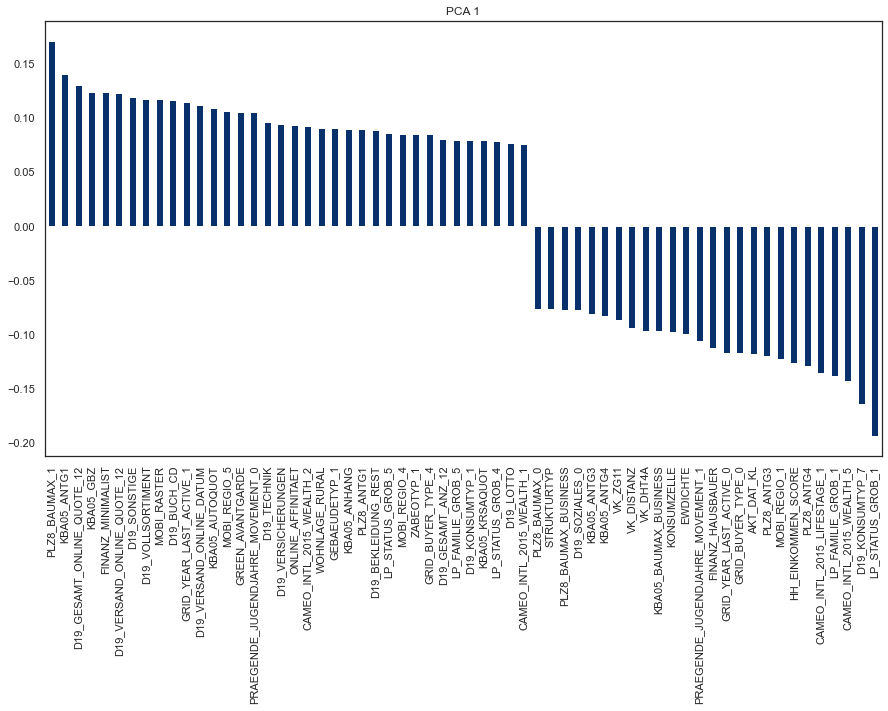

In [33]:
plot_components('PCA 1', pca_results, threshold=0.075)

### Summary for PCA component 1 - Top earning settled families

Uses mainly geographical location, mobility and financial status to describe the population and explain 8.1% of the variance.

Analysing the strongest positive and negative linear relationships this component is describing top earner families living in area's with mostly 1-2 family houses which they own, outside of the city in less dense area's, but in larger residential area’s. They own multiple cars per household. They are active online customers, yet minimalistic, and are part of the green avantgarde.

### Detailed Analysis for PCA component 1

<b>Types of building<b>

Strong positive correlations:
- PLZ8_BAUMAX_1 = most common building are mainly 1-2 family houses in the sub-postalcode
- RR3_ID microcell - KBA05_ANTG1 = High share of 1-2 family houses in the cell
- KBA05_GBZ – Number of buildings in the microcell is going up which suggest it's a large residential area
- WOHNLAGE_RURAL = Living outside of the city
- GEBAEUDETYP_1 = residential building

Strong Negative correlations:
- PLZ8_ANTG3 / ANTG4 = > 6 family houses  
- EWDICHTE density per square km is coming down

<b>Vehicles and mobility<b>

Strong positive correlations:
- KBA05 - AUTOQUOT - Share of cars per household high
- MOBI_RASTER / MOBI_REGIO_5 = very low mobility is going up

Strong Negative correlations:
- MOBI_REGIO_1 = very high mobility is going down

<b>Financial status and family orientation<b>

Positive correlations
- Finance minimalist - moving towards low means they are not minimalistic
- CAMEO_INTL_2015_WEALTH_2 = Prosperous Households
- LP_STATUS_GROB 4 and 5 = top earners and house owners
- LP_FAMILIE_GROB_5 = multi familie households
- CAMEO_INTL_2015_WEALTH_LIFESTAGE_1 = prefamily and single people going down


Negative correlations
- Hausbauer – moving towards high means they are house owners
- HH_EINKOMMEN_SCORE – organized from 1 = high, 5 = low so I assume it moves towards high income which I interpret as the individuals are fro high income group
- LP_FAMILIE_GROB_1 = single
- LP_STATUS_GROB_1 = low income earners
- CAMEO_INTL_2015_WEALTH_5 = poorer households

<b>Online and consumer behaviour<b>
Positive
- High online transactions especially in category MAIL-ORDER category
- Buying mostly in categories: other, books, cd, house deko, technical, cloths, insurance, complete mail-order offers
- Online affinity is increasing
- Online transaction activity in the last year
- D_KONSUMTYP_1 – Konsumer type Universal

Negative
- D19_KONSUMTYP_7 = Prospect > 24 months 
- Last active more than 3 years ago and never bought online


<b>Personal behavior<b>
- Green Avantgarde = Belongs to the green avantgarde
- PRAEGENDE_JUGENDJAHRE_MOVEMENT_0 – green avant-garde is going up while PRAEGENDE_JUGENDJAHRE_MOVEMENT_1 – mainstream is going down
- ZABEOTYP_1  = green

## PCA 2: Digital media kids - young poorer families

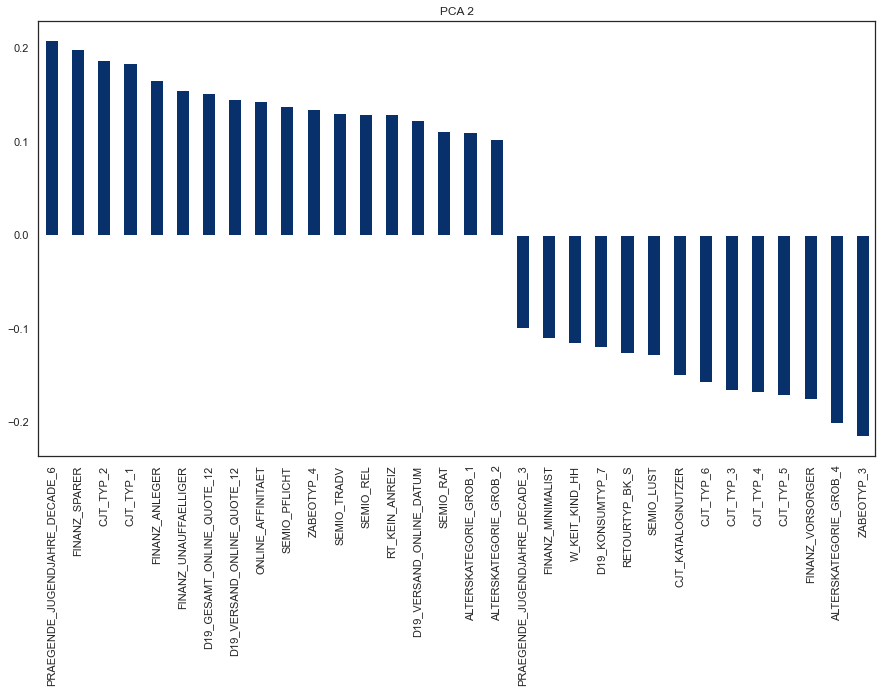

In [58]:
# Map weights for the second principal component to corresponding feature names
# and then print the linked values, sorted by weight.
plot_components('PCA 2', pca_results, threshold=0.1)

### Summary for PCA component 2 - Digital Media Kids

PCA component 2 is focussing on youth movement and age, financial status and online shopping behaviour and explain 5.6% of the variance when we use 180  components

This component describe digital media kids, adults who’s youth was in their 90’s. Younger low income families with high probability of having children. They have a strong online presence, seems to shop online frequently and react well to advertising campaigns and catalogues. They don’t save or invest, but in contrast wants to be financially prepared.

### Detailed analysis for PCA component 2

<b>Financial status and family orientation<b>

Positive correlations:
- PRAEGENDE_JUGENDJAHRE_DECADE_6  = 90’s is going up suggesting these are younger people
- FINANZ_SPARER, FINANZ_ANLEGER, FINANZ_UNAUFFAELLIGER moving towards low means they don’t save or invest

Negative correlations:
- FINANZ_VORSORGER, FINANZ_MINIMALIST moving towards high so means they like to be financially prepared, and they are minimalists
- W_KEIT_KIND_HH - likelihood of a child present in this household are likely

<b>Online and consumer behavior<b>

Positive correlations:
- CJT 1, 2 – moving towards low means NOT advertising and consumption minimalist and tradisionalist
- On-line transactions are high, respond to full mail-order offers
- Multi buyers
- Buy cloths and insurance
- D19_KONSUMTYP_1 = Universal


Negative correlations:
- Negative CJT 3-6 = moving towards high means a big shopper (store, online shopper, cross channel)
- RETOURTYP_BK_S – is this return customer - going down means  it’s a return customer possibly crazy shopper
- D19_KONSUMTYP_7 = inactive (but means opposite actually suggest it’s an active customer)

<b>Personal behavior<b>

Positive correlations:
- NOT Dutiful, Traditional, Rational, Religious, Cultural
- ZABEOTYP_4 Energy consumer – price driven means looking for bargains
- ALTERSKATEGORIE_GROB_1 = < 30 years
- ALTERSKATEGORIE_GROB_2 = between 30 and 60 , but with slightly lower weight 
- LP_STATUS_GROB_1 – low-income earners

Negative correlations:
- PRAEGENDE_JUGENDJAHRE_DECADE_3: 46 – 60 going down, means it more younger people
- ALTERSKATEGORIE_GROB_4 – Over 60 is going down
- ZABEOTYP_3 Energy – fair supplied
- They are  sensual or dutiful

## PCA 3 - Upper class vehicles from West Germany

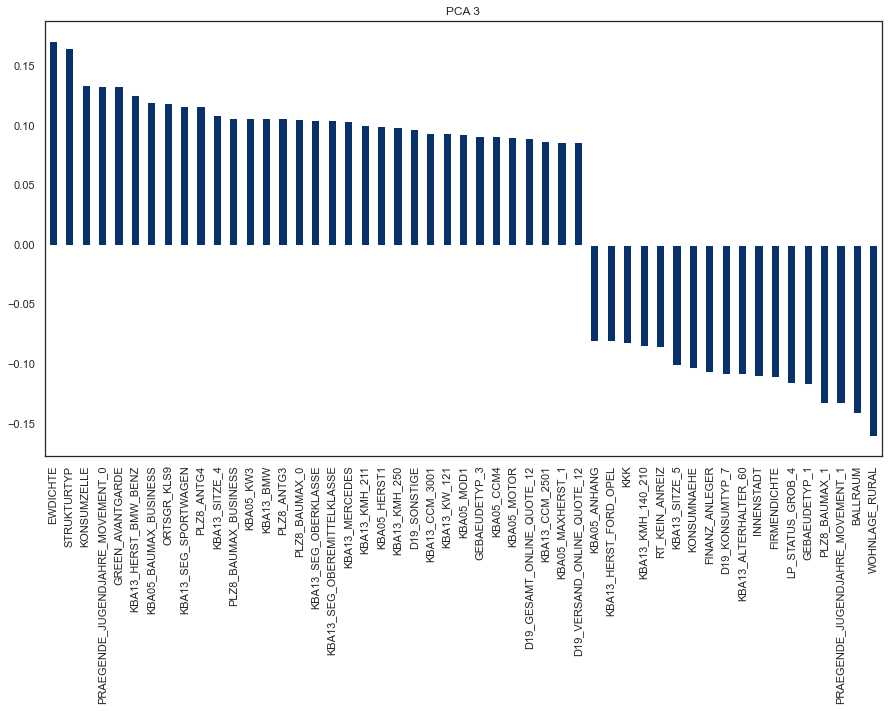

In [69]:
# Map weights for the third principal component to corresponding feature names
# and then print the linked values, sorted by weight.
plot_components('PCA 3', pca_results, threshold=0.08)

### Summary for PCA component 3 - Upper class car lovers living near city centre from West-Germany

PCA component 3 persona describes individuals that are living in dense populated in West-Germany area's near the city centre. They live in area's where there are high number of > 6 family houses but also lots of businesses present. They drive top and middle class German manufacturer car brands mostly smaller BMW and Mercedes with <= 4 seats.They are part of the green avantgarde. These individuals are not in age group 46-60, and are most likely to be pre-family and single younger people. They were active online in the last year.
 

### Detailed analysis for PCA component 3

<b>Types of building<b>

Strong positive correlations:
- EDWICHTE – living in dense area’s
- PLZ8_ANTG4 – > high share of > 10 family houses in PLZ8
- KBA05_ANTG2 - number of 3-5 family houses in cell is going up    
- MOBI_REGIO_1 – very high mobility
- ORTSGR_KLS9 – size of community living in denser area’s
- GEBAEUDETYP_3 - mix residential and company buildings in the area
- BUSINESS - some are business buildings in the area's
- OST_WEST_KZ - going up means it's west Germany
- RELAT_AB - unemployment rate is going up

Strong Negative correlations:
- KBA05_ANTG1 / BAUMAX1 / PLZ8_ANTG1 – no 1-2 family houses in the micro cell
- WOHNLAGE_RURAL – do not live in rural area’s cenre
- BALLRAUM / INNENSTADT – close to city center or next urban
- GEBAEUDETYP_1 - not just residential buildings
- LP_STATUS_GROB_4 - not house owners
- INNERSTADT - close to city centre
- KONSUMNAEHE – building are close to POS

<b>Financial status<b>

Positive correlations
    
- LP_STATUS_GROB_5 - top earners    
- KBA13_ALTERHALTER_61 - share of car owners elder than 61 within the PLZ8 is going up
- CAMEO_INTL_2015_LIFESTAGE_1 - pre-family and single is going up
- KBA05_KW3 - share of cars with an engine power of more than 119 KW

Negative correlations

- LP_STATUS_GROB_4 – NOT house owners
- FINANZ_ANLEGER are moving towards low which I interpret as they are investors    
- CAMEO_INTL_2015_WEALTH_2 - Prosperous Households comes down
- KKK - purchasing power moving toward high 
- KBA13_ALTERHALTER_60 - share of car owners between 40 - 60 is going down means they are not in this age group    
<b>Vehicle data<b>
    
Positive correlations
- KBA13_HERST_BMW_BENZ - share of BMW & Mercedes Benz within the PLZ8 are going up
- KBA05_HERST1 - top german car dealers are going up
- KBA13_SITZE4 - cars with less that 5 seats are going up
- KBA13_SEG_OBERKLASSE / MITTLEOBERKLASSE - share of middle/upper class cars are going up
- KBA05_MOTOR - size of engin going up
- KBA13_KMH_211 / 250 - max speed above ...
    
<b>Online and consumer behavior<b>

Positive correlations
- Active in last year 

Negative correlations

- Inactive customers
- D19_KONSUMPTYP_7 - going down means not inactive konsumers   

<b>Personal behavior<b>

Positive correlations
- GREEN_AVANTGARDE and  PRAEGENDE_JUGENDJAHRE_MOVEMENT_0 = part of green avantgarde    

Negative correlations

## PCA 4: Mid-class vehicles from east Germany

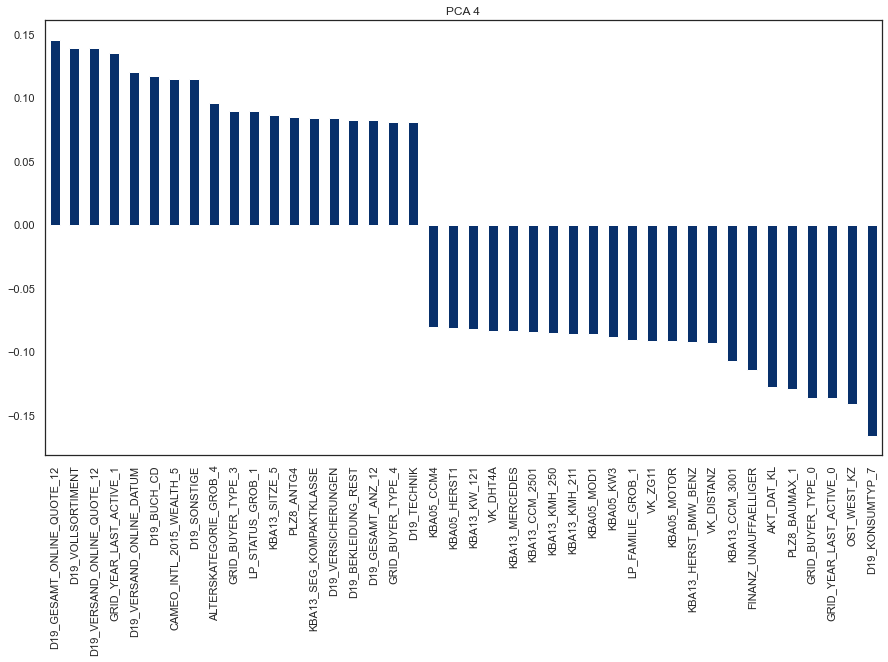

In [68]:
# Map weights for the third principal component to corresponding feature names
# and then print the linked values, sorted by weight.
plot_components('PCA 4', pca_results, threshold=0.08)

**PCA component 4** persona is describing older people > 60 years living in East-Germany from poorer households and lower income and not part of green avantgarde. They are driving smaller mid-class vehicles like Ford, Masda and of Asien origin with 5 seats. They are frequent online shoppers buying insurance, technology and respond to complete mailout offers and were active in the last year. They live in area's where 6-10 family houses in the area are present.

## PCA 5 - Dominating males who hate shopping

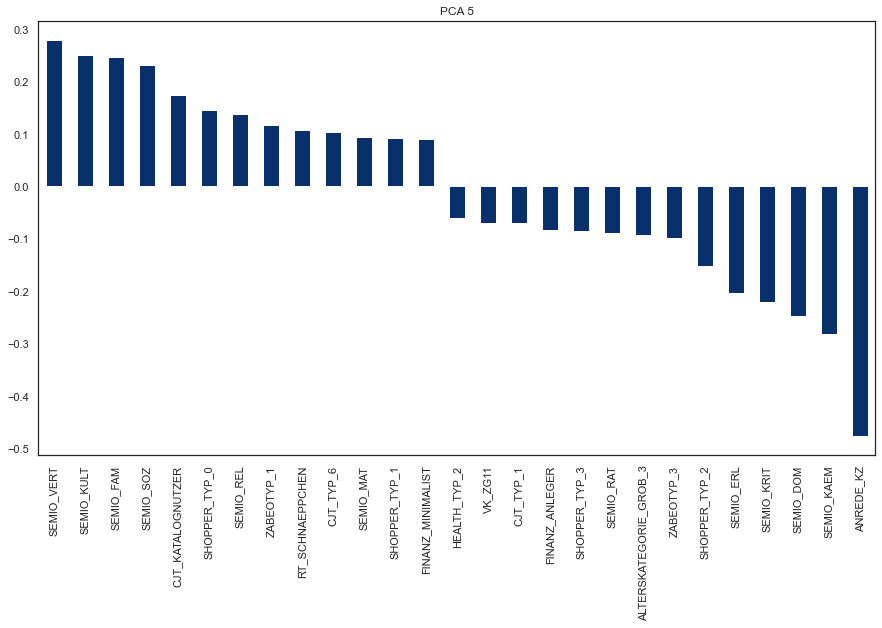

In [37]:
# Map weights for the third principal component to corresponding feature names
# and then print the linked values, sorted by weight.
plot_components('PCA 5', pca_results, threshold=0.06)

**PCA Component 5** is using mainly personal interest to describe the persona.
This persona represent males, fightfull, dominant, critical and rational, but not dreamy, cultural, family orientated, social or religious. They hate shopping and are frequent users of advertising catalogues. They are unlikely to be 46-60 years old. Online shopping are a great convenience for those who hate going to the shops

<a id='cluster_population'></a>
# Step 5: Population Segmentation

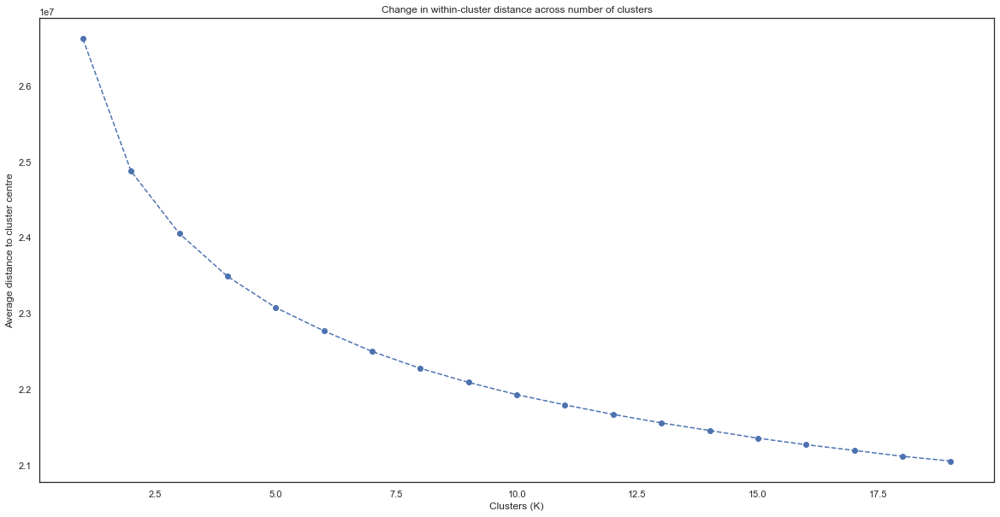

In [38]:
# Over a number of different cluster counts, 
# run k-means clustering on the data and compute the average within-cluster distances
scores = []
clusters = list(range(1,20,1))
for cluster in clusters:
    scores.append(get_kmeans_score(azdias_pca, cluster))
    
# Investigate the change in within-cluster distance across number of clusters.
fig = plt.figure(figsize=(20,10))
plt.plot(clusters, scores, linestyle = '--', marker='o', color = 'b')
plt.xlabel('Clusters (K)')
plt.ylabel('Average distance to cluster centre')
plt.title('Change in within-cluster distance across number of clusters')
plt.show()

In [39]:
# Re-fit the k-means model with the selected number of clusters and obtain
# cluster predictions for the general population demographics data.
kmeans = KMeans(n_clusters=8)
model = kmeans.fit(azdias_pca)
demographic_labels = model.predict(azdias_pca)

# Save model to file to be re-used
dump(model, open(filename_kmeans, 'wb'))

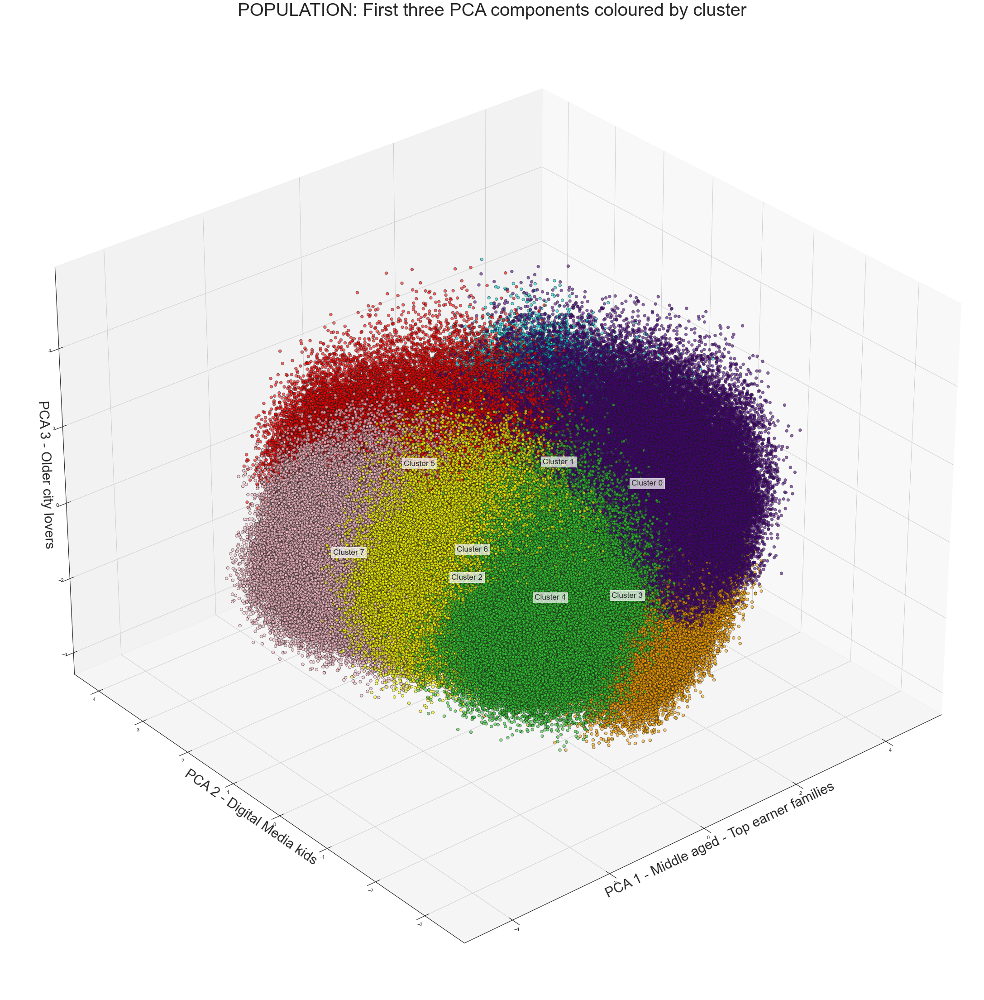

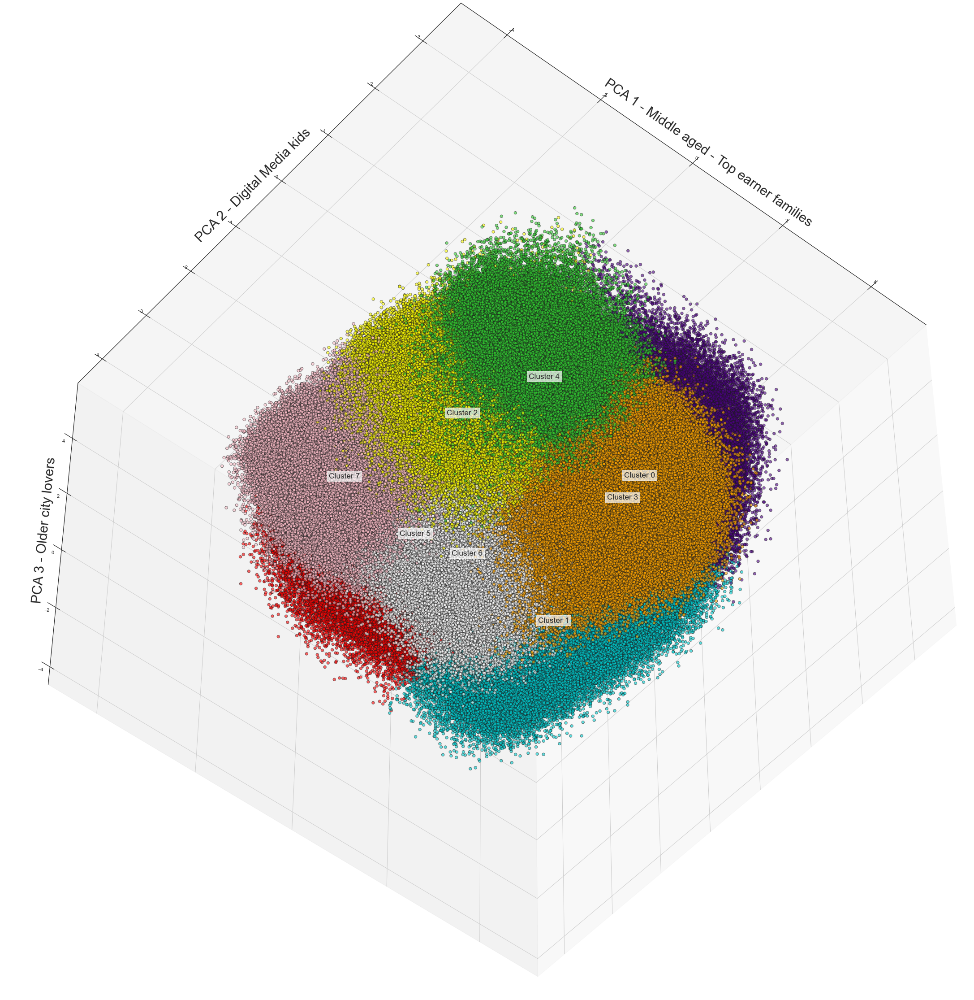

In [40]:
# Plot the first 3 PCA components of the demographic data colored by assigned cluster

label_color_map = {0 : 'indigo',
                   1 : 'darkturquoise',
                   2 : 'yellow',
                   3 : 'orange',
                   4 : 'limegreen',
                   5 : 'red',
                   6 : 'white',
                   7 : 'pink',
                   }

plot_clusters(azdias_pca, 
              demographic_labels, 
              label_color_map, 
              title="POPULATION: First three PCA components coloured by cluster",
              elev=30,
              azim=-130)

# from another angle
plot_clusters(azdias_pca, 
              demographic_labels, 
              label_color_map, 
              title=None,
              elev=-50,
              azim=-130)

<a id='cluster_customer'></a>
# Step 6: Customer Segmentation

The main bulk of your analysis will come in this part of the project. Here, you should use unsupervised learning techniques to describe the relationship between the demographics of the company's existing customers and the general population of Germany. By the end of this part, you should be able to describe parts of the general population that are more likely to be part of the mail-order company's main customer base, and which parts of the general population are less so.

In [41]:
customer_pca = pca.transform(scaled_customers)
df_customer_pca = pd.DataFrame(customer_pca, 
                               columns=np.arange(1, 181),
                               index=df_scaled_customers.index)
df_customer_pca.shape

(191652, 180)

In [42]:
df_customer_pca.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180
LNR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
9626,2.701546,-2.358388,0.825906,-0.794569,1.161770,0.747746,-0.431119,0.823910,0.820090,0.230111,0.265172,0.251893,0.348065,-0.172869,0.763178,0.385204,-0.581386,0.077741,-0.011963,0.380759,-0.354976,-0.037006,0.184928,-0.657339,-0.460075,-0.377740,-0.494008,-0.290624,-0.284226,0.307632,-0.185085,-0.018258,0.270785,-0.242279,0.166837,0.159504,-0.714135,-0.826969,0.196701,0.419732,0.432466,0.135261,-0.504506,0.010206,0.381142,0.202274,-0.143589,0.199756,0.893881,-0.199367,-0.367314,-0.224298,0.491974,0.834205,-0.350372,-0.513875,0.574953,-0.396479,-0.550389,0.365713,0.100939,-0.142854,-0.434543,0.228546,0.266351,-0.195289,-0.040640,-0.225532,-0.708258,-0.094327,0.252748,-0.021813,-0.063781,-0.499857,-0.007876,-0.499644,-0.117632,-0.559093,0.387332,0.262809,-0.284793,-0.138421,-0.019173,-0.097965,0.404468,-0.230365,0.596499,0.005335,0.367318,-0.561327,0.111775,0.432151,0.055084,0.593155,-0.040611,0.134283,0.379399,-0.380882,-0.279151,-0.426565,-0.002501,0.062875,0.141984,-0.019440,-0.062646,-0.287568,0.422481,0.120820,0.308705,0.348995,0.290234,0.241667,-0.422183,-0.093646,-0.026110,-0.355217,0.231785,0.004593,0.174655,-0.378871,-0.323222,-0.132434,0.041579,-0.121930,-0.225975,0.688539,0.303453,-0.316602,0.568289,0.227179,0.403419,-0.043286,-0.471082,-0.023577,-0.380791,-0.103409,0.222439,0.238808,0.241208,-0.036177,-0.094576,0.242482,0.091885,-0.012844,0.066995,-0.346341,0.139258,-0.270076,0.008038,-0.042992,0.016811,-0.388866,0.206340,-0.296814,0.208042,-0.084221,-0.282527,0.130108,-0.157821,0.038358,0.083278,0.131007,-0.025316,0.640853,0.064298,-0.183799,0.276376,0.437962,0.119588,-0.602597,0.205423,0.062395,0.397866,-0.245363,-0.166576,0.337033,0.014157,0.018931,-0.284815,0.012309
9628,0.559466,-1.468556,-0.458090,0.661910,0.848929,0.536914,-0.733072,0.178882,-0.043458,-0.520803,-0.738273,0.063351,0.106033,0.497337,0.146907,0.739938,-0.384154,0.470770,0.812216,0.242468,-0.082012,-0.370999,-0.150255,0.011714,0.452303,-0.527719,-0.222847,-0.000591,-0.009528,0.051662,0.098068,-0.126970,0.251089,0.176699,-0.462106,-0.033584,0.283821,-0.107405,-0.308784,0.272457,0.759078,0.101365,-0.332913,-0.784299,0.013431,-0.427313,0.304449,0.303109,0.473322,-0.035668,-0.198297,-0.078209,-0.185911,0.178838,0.127729,0.541728,-0.476662,-0.036241,0.136761,0.359035,0.351694,0.168800,0.020430,0.166889,0.578929,0.005155,0.091186,-0.217879,-0.009985,0.082402,0.054801,0.032689,-0.109586,0.242865,0.175472,0.202358,0.038226,0.385360,0.177372,-0.045043,-0.214008,0.183432,-0.627625,-0.046894,-0.077131,0.769730,0.423644,0.246281,0.045478,0.329237,-0.646987,-0.532291,-0.290382,0.081501,0.091705,-0.407356,0.040373,-0.088906,-0.198077,-0.230406,-0.004852,0.315467,0.102658,0.117495,0.301442,0.099224,0.460411,0.360888,0.065959,-0.072729,-0.170839,-0.011218,0.734203,0.022666,-0.111877,0.010258,-0.393548,-0.185194,-0.236428,-0.034104,-0.018017,-0.083960,-0.239884,0.484850,-0.180524,0.157749,-0.110249,-0.161607,-0.309280,-0.072617,-0.233298,0.092504,0.199215,0.094222,0.024816,0.096125,-0.416654,0.459154,-0.287290,-0.413502,0.055183,0.391593,0.092057,-0.132947,-0.555563,0.236746,-0.165996,-0.161796,0.275579,-0.280104,0.037636,-0.101694,-0.028471,0.272295,-0.060825,0.152697,-0.205618

In [43]:
# What is returned, is for each person (row) in the customer dataset, 
# to which k-means group (1-20) they belong to
customer_labels = model.predict(customer_pca)
df_customer_labels = pd.DataFrame(customer_labels, 
                                  columns=['cluster'],
                                  index=df_scaled_customers.index)

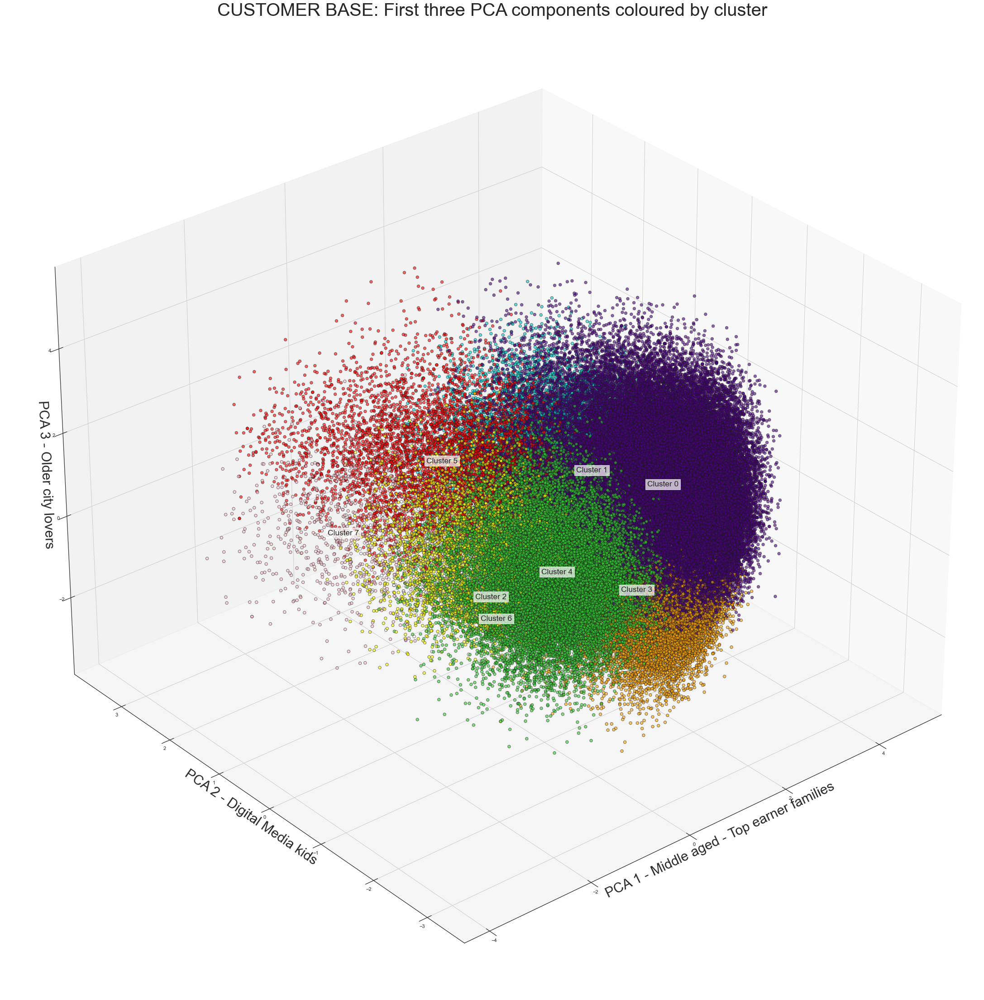

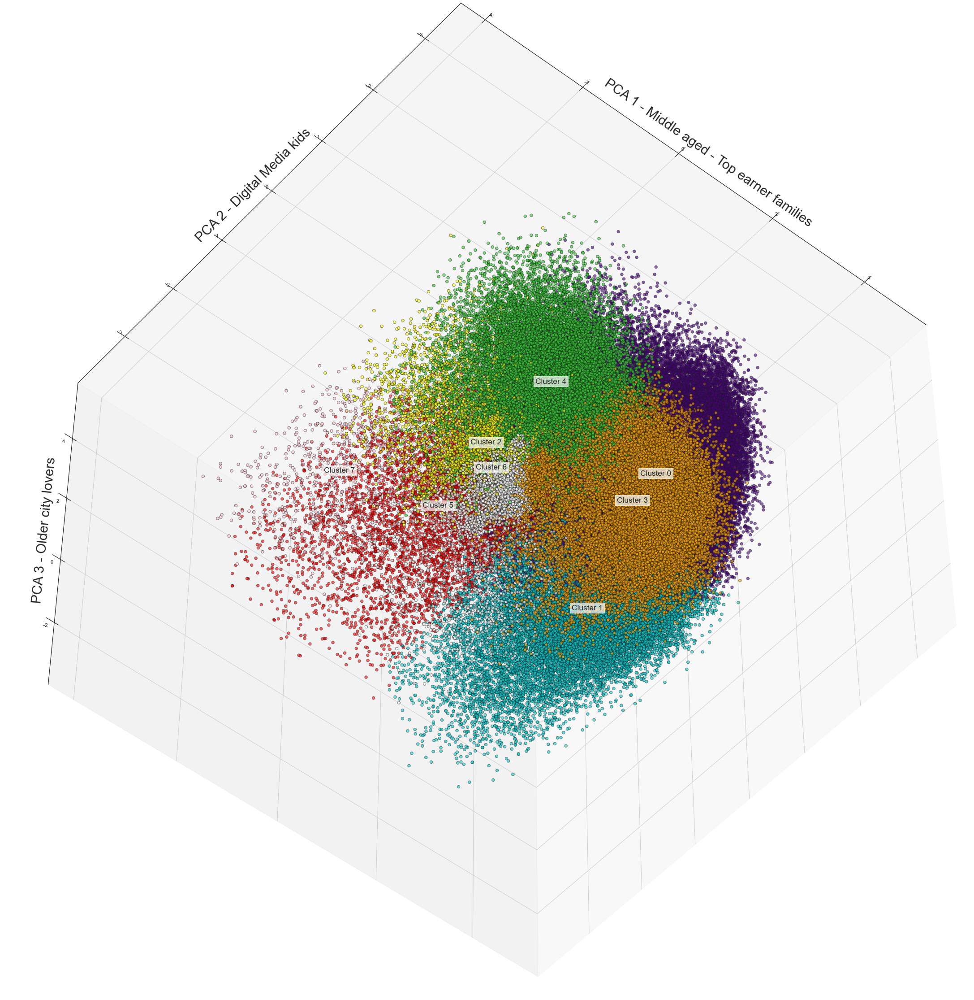

In [44]:
# Plot the first 3 PCA components of the demographic data colored by assigned cluster
                 
plot_clusters(customer_pca, 
          customer_labels, 
          label_color_map, 
          title="CUSTOMER BASE: First three PCA components coloured by cluster",
          elev=30,
          azim=-130)

# from another angle
plot_clusters(customer_pca, 
              customer_labels, 
              label_color_map, 
              title=None,
              elev=-50,
              azim=-130)

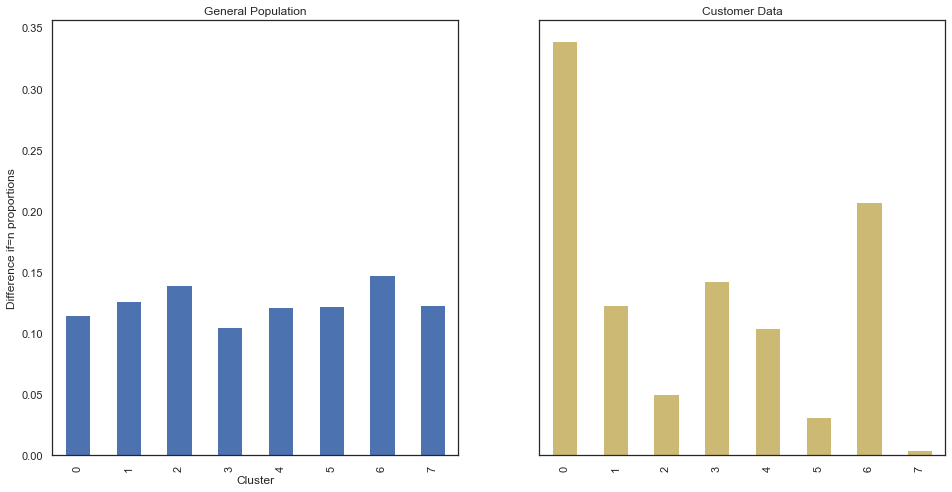

In [45]:
# Compare the proportion of data in each cluster for the customer data to the
# proportion of data in each cluster for the general population.

customer_proportion = df_customer_labels.cluster.value_counts(normalize=True, sort=False).sort_index()
population_proportion = pd.DataFrame(demographic_labels, columns=['cluster']).cluster.value_counts(normalize=True, sort=False)
proportion_differences = customer_proportion - population_proportion

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharex=True, sharey=True)

population_proportion.plot(kind='bar', color='b', ax=axes[0])

customer_proportion.plot(kind='bar', color='y', ax=axes[1])

axes[0].set_title('General Population')
axes[1].set_title('Customer Data')

axes[0].set_ylabel('Difference if=n proportions')
axes[0].set_xlabel('Cluster')

plt.show()

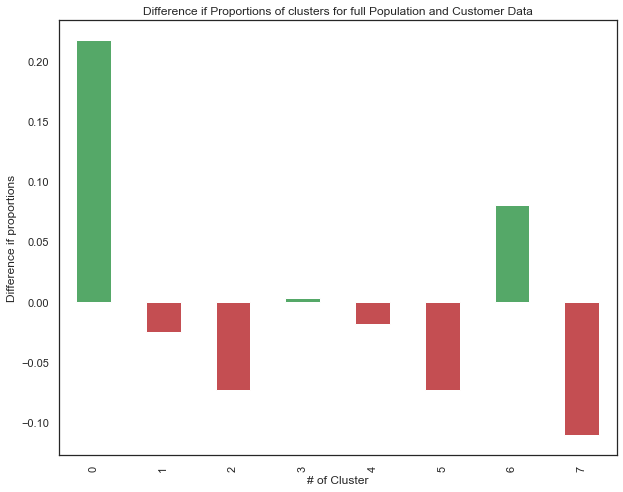

In [46]:
proportion_differences.plot(kind='bar', 
                            color=np.vectorize({True: 'g', False: 'r'}.get)(proportion_differences > 0), 
                            figsize=(10,8))
plt.xlabel('# of Cluster')
plt.ylabel('Difference if proportions')
plt.title('Difference if Proportions of clusters for full Population and Customer Data')
plt.show()

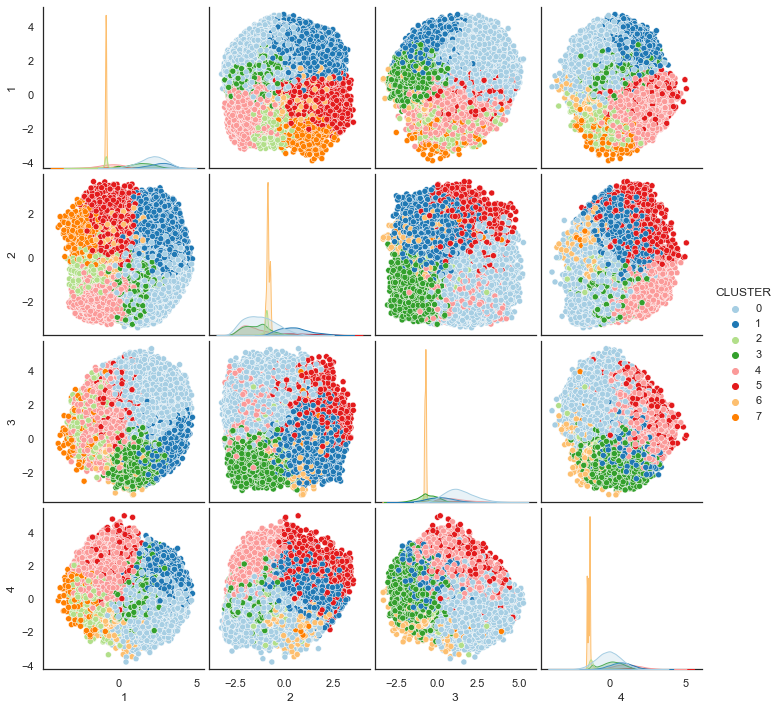

In [47]:
# Visualize the role each cluster is playing in the first 5 PCA components

# join PCA and KMeans results, by adding the cluster each customer is assigned to, to the PCA results
df_customer_pca['CLUSTER'] = customer_labels

sns.pairplot(df_customer_pca,
             vars = np.arange(1, 5), 
             diag_kind = 'kde',
             hue="CLUSTER",
             palette="Paired")

plt.show()

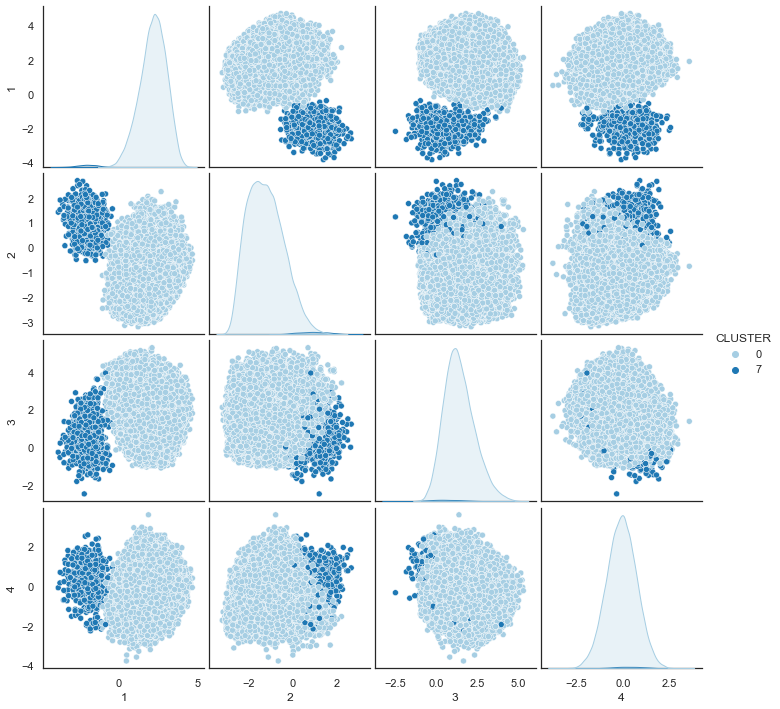

In [70]:
# Visualize the role only cluster 1, which is most the over represented, 
# and cluster 7, which is the most under represented, is playing in the first 3 PCA components
df_customer_pca_overrep = df_customer_pca[df_customer_pca['CLUSTER'].isin([0, 7])]

sns.pairplot(df_customer_pca_overrep,
             vars = np.arange(1, 5),
             diag_kind = 'kde',
             hue="CLUSTER",
             palette="Paired")

plt.show()

In [49]:
def plot_kmeans_weights_to_pca_relationship(kmeans, cluster, columns, threshold=0.05):
    
    weights = pd.DataFrame(np.round(kmeans.cluster_centers_, 4), columns=columns)
    cluster_weight = weights.iloc[cluster, :]
    title = 'PCA importance for cluster ' + str(cluster)
    cluster_weight.loc[(cluster_weight > threshold) | (cluster_weight < -threshold)].sort_values(ascending=False).plot(kind="bar", 
                                                                                      figsize=(10, 6), 
                                                                                      title=title)

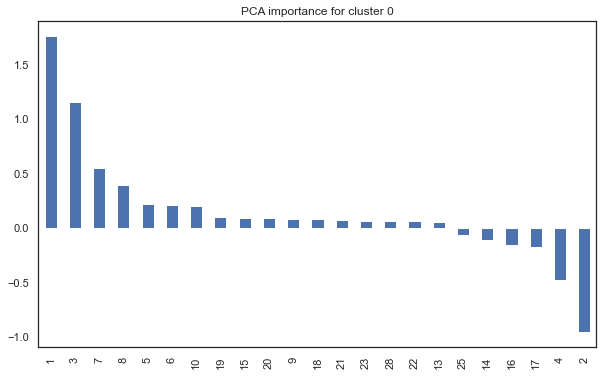

In [71]:
# which kind of people are over represented compared to the population
plot_kmeans_weights_to_pca_relationship(
    kmeans, 0, df_customer_pca.columns[:-1].tolist())

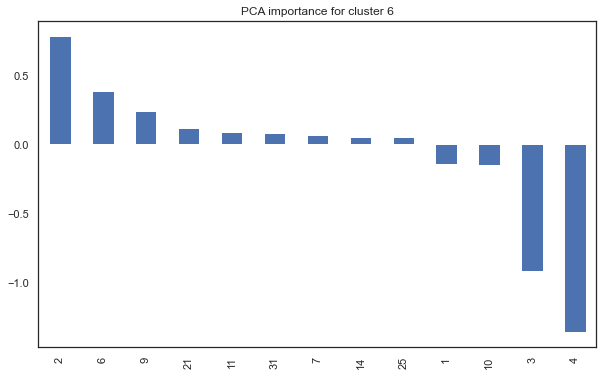

In [74]:
# which kind of people are over represented compared to the population
plot_kmeans_weights_to_pca_relationship(
    kmeans, 6, df_customer_pca.columns[:-1].tolist())

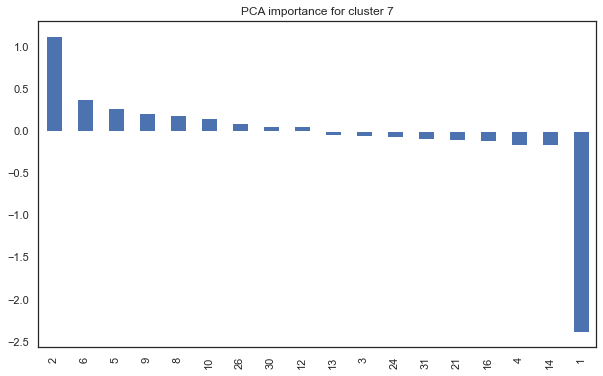

In [72]:
# which kind of people are under represented compared to the population
plot_kmeans_weights_to_pca_relationship(
    kmeans, 7, df_customer_pca.columns[:-1].tolist())

## Build customer dataset that can be re-used in supervised learing

In [53]:
customers_extra

,PRODUCT_GROUP,CUSTOMER_GROUP,ONLINE_PURCHASE
LNR,,,
9626,COSMETIC_AND_FOOD,MULTI_BUYER,0
9628,FOOD,SINGLE_BUYER,0
143872,COSMETIC_AND_FOOD,MULTI_BUYER,0
143873,COSMETIC,MULTI_BUYER,0
143874,FOOD,MULTI_BUYER,0
...,...,...,...
154561,COSMETIC_AND_FOOD,MULTI_BUYER,0
154563,COSMETIC,SINGLE_BUYER,0
148813,COSMETIC_AND_FOOD,MULTI_BUYER,0


In [54]:
customers_enriched = df_customer_pca.merge(customers_extra, how='left', left_index=True, right_index=True)

In [55]:
customers_enriched.drop('CUSTOMER_GROUP', inplace=True, axis=1)

In [56]:
customers_enriched.head()

,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,CLUSTER,PRODUCT_GROUP,ONLINE_PURCHASE
LNR,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
9626,2.701546,-2.358388,0.825906,-0.794569,1.161770,0.747746,-0.431119,0.823910,0.820090,0.230111,0.265172,0.251893,0.348065,-0.172869,0.763178,0.385204,-0.581386,0.077741,-0.011963,0.380759,-0.354976,-0.037006,0.184928,-0.657339,-0.460075,-0.377740,-0.494008,-0.290624,-0.284226,0.307632,-0.185085,-0.018258,0.270785,-0.242279,0.166837,0.159504,-0.714135,-0.826969,0.196701,0.419732,0.432466,0.135261,-0.504506,0.010206,0.381142,0.202274,-0.143589,0.199756,0.893881,-0.199367,-0.367314,-0.224298,0.491974,0.834205,-0.350372,-0.513875,0.574953,-0.396479,-0.550389,0.365713,0.100939,-0.142854,-0.434543,0.228546,0.266351,-0.195289,-0.040640,-0.225532,-0.708258,-0.094327,0.252748,-0.021813,-0.063781,-0.499857,-0.007876,-0.499644,-0.117632,-0.559093,0.387332,0.262809,-0.284793,-0.138421,-0.019173,-0.097965,0.404468,-0.230365,0.596499,0.005335,0.367318,-0.561327,0.111775,0.432151,0.055084,0.593155,-0.040611,0.134283,0.379399,-0.380882,-0.279151,-0.426565,-0.002501,0.062875,0.141984,-0.019440,-0.062646,-0.287568,0.422481,0.120820,0.308705,0.348995,0.290234,0.241667,-0.422183,-0.093646,-0.026110,-0.355217,0.231785,0.004593,0.174655,-0.378871,-0.323222,-0.132434,0.041579,-0.121930,-0.225975,0.688539,0.303453,-0.316602,0.568289,0.227179,0.403419,-0.043286,-0.471082,-0.023577,-0.380791,-0.103409,0.222439,0.238808,0.241208,-0.036177,-0.094576,0.242482,0.091885,-0.012844,0.066995,-0.346341,0.139258,-0.270076,0.008038,-0.042992,0.016811,-0.388866,0.206340,-0.296814,0.208042,-0.084221,-0.282527,0.130108,-0.157821,0.038358,0.083278,0.131007,-0.025316,0.640853,0.064298,-0.183799,0.276376,0.437962,0.119588,-0.602597,0.205423,0.062395,0.397866,-0.245363,-0.166576,0.337033,0.014157,0.018931,-0.284815,0.012309,0,COSMETIC_AND_FOOD,0
9628,0.559466,-1.468556,-0.458090,0.661910,0.848929,0.536914,-0.733072,0.178882,-0.043458,-0.520803,-0.738273,0.063351,0.106033,0.497337,0.146907,0.739938,-0.384154,0.470770,0.812216,0.242468,-0.082012,-0.370999,-0.150255,0.011714,0.452303,-0.527719,-0.222847,-0.000591,-0.009528,0.051662,0.098068,-0.126970,0.251089,0.176699,-0.462106,-0.033584,0.283821,-0.107405,-0.308784,0.272457,0.759078,0.101365,-0.332913,-0.784299,0.013431,-0.427313,0.304449,0.303109,0.473322,-0.035668,-0.198297,-0.078209,-0.185911,0.178838,0.127729,0.541728,-0.476662,-0.036241,0.136761,0.359035,0.351694,0.168800,0.020430,0.166889,0.578929,0.005155,0.091186,-0.217879,-0.009985,0.082402,0.054801,0.032689,-0.109586,0.242865,0.175472,0.202358,0.038226,0.385360,0.177372,-0.045043,-0.214008,0.183432,-0.627625,-0.046894,-0.077131,0.769730,0.423644,0.246281,0.045478,0.329237,-0.646987,-0.532291,-0.290382,0.081501,0.091705,-0.407356,0.040373,-0.088906,-0.198077,-0.230406,-0.004852,0.315467,0.102658,0.117495,0.301442,0.099224,0.460411,0.360888,0.065959,-0.072729,-0.170839,-0.011218,0.734203,0.022666,-0.111877,0.010258,-0.393548,-0.185194,-0.236428,-0.034104,-0.018017,-0.083960,-0.239884,0.484850,-0.180524,0.157749,-0.110249,-0.161607,-0.309280,-0.072617,-0.233298,0.092504,0.199215,0.094222,0.024816,0.096125,-0.416654,0.459154,-0.287290,-0.413502,0.055183,0.391593,0.092057,-0.132947,-0.555563,0.236746,-0.165996,-0.161796,0.275579,-0.280104,0.0

In [73]:
# write customer pca and cluster results for reuse during supervised predictions

# make data dir, if it does not exist
if not os.path.exists(path_clean):
    os.makedirs(path_clean)
    
pd.DataFrame(customers_enriched).to_csv(filename_customer_clusters)

<a id='references'></a>
# References


PCA
- https://online.stat.psu.edu/stat505/lesson/11/11.4
- https://stats.stackexchange.com/questions/2691/making-sense-of-principal-component-analysis-eigenvectors-eigenvalues


Imputing missing values
- https://machinelearningmastery.com/iterative-imputation-for-missing-values-in-machine-learning/
- https://scikit-learn.org/stable/modules/generated/sklearn.impute.IterativeImputer.html


Visualization
- https://stackoverflow.com/questions/49564844/3d-pca-in-matplotlib-how-to-add-legend
- https://stackoverflow.com/questions/28227340/kmeans-scatter-plot-plot-different-colors-per-cluster

I have completed the first term of this program in nanodegree 'Introduction to Machine Learning using Pytorch', therefore I am familiar with the first part of this project, from the unsupervised learning project. I have copied some of my prevoius work to use as a base. The versions of those two datasets used in this project include many more features and has not been pre-cleaned, a lot of additional analysis was needed